# Washington D.C. Neighborhood Analysis
**Capstone Project - The Battle of Neighborhoods (Week 2)**

This notebook contains the analysis portion of my project.
***

## Data Collection

### Scraping the data from D.C. Health Matters 
The data from D.C. Health Matters needs to be scraped from the website as you cannot just download it in csv form. There is also a separate URL for each filter you select which includes different races and median income. Therefore, I have created a function for scraping the data so that I can reuse it for each URL.

In [1]:
# Import necessary libraries
from fake_useragent import UserAgent # creates user agent for website calls
import requests # allows you to make requests from HTML
from bs4 import BeautifulSoup # pull data from HTML and allows you to parse it
import pandas as pd # data analysis library
import numpy as np # array library

In [2]:
# The name of my function is scrape_data
# The value of RACE_ID is input when the function gets called and is selected to correspond with ID numbers
# designated by the D.C. Health Matters website
def scrape_data(RACE_ID):
    # URL to scrape data from
    scrapeLink = 'https://www.dchealthmatters.org/?module=demographicdata&controller=index&action=view&localeId=9409&localeTypeId=0&tagFilter=940&id={}'.format(
        RACE_ID)

    #pulling HTML from URL
    ua1 = UserAgent()
    randomHeader = {'User-Agent':str(ua1.random)}
    page = requests.get(scrapeLink, randomHeader)
    soup = BeautifulSoup(page.content, 'html.parser')

    #identify which race corresponds with RACE_ID
    race = soup.find_all('title')[0]
    race = str(race)
    race = race.split(' :: ')
    race = race[2].replace('</title>','')

    #find the right table
    table = soup.find_all('table')[2]

    # Parse table and convert HTML to DataFrame
    n_columns = 0
    n_rows=0
    column_names = []
    
    # Find number of rows and columns
    # we also find the column titles if we can
    for row in table.find_all('tr'):
                
        # Determine the number of rows in the table
        td_tags = row.find_all('td')
        if len(td_tags) > 0:
            n_rows+=1
            if n_columns == 0:
                # Set the number of columns for our table
                n_columns = len(td_tags)
                        
        # Handle column names if we find them
        th_tags = row.find_all('th') 
        if len(th_tags) > 0 and len(column_names) == 0:
            for th in th_tags:
                column_names.append(th.get_text())
    
    # creating the DataGrame with the right number of rows and columns
    columns = range(0,n_columns)
    df = pd.DataFrame(columns = columns, index= range(0,n_rows))

    # pulling the data out from the HTML and populating the DataFrame
    row_marker = 0
    for row in table.find_all('tr'):
        column_marker = 0
        columns = row.find_all('td')
        for column in columns:
            df.iat[row_marker,column_marker] = column.get_text()
            column_marker += 1
        if len(columns) > 0:
            row_marker += 1
    
    df.rename(columns={0:'Zip Code', 1:race}, inplace=True) # rename columns from index to Zip Code and Race
        
    return df

In [3]:
# Set race_id from website
df_tot = pd.DataFrame() # initialize empty DataFrame
for i in range(1531, 1546, 1): # Loop over each Race ID
    raceID=i
    df = scrape_data(raceID)
#Clean up data
    df = df.drop([2, 3, 4], axis=1) # Drop empty rows
    for col in df.columns[:]: 
        df[col]=df[col].str.replace(",", "").str.replace("%", "") # remove special characters from data
        df[col] = pd.to_numeric(df[col], errors='ignore') # convert values that should be numeric to numeric
    if i==1531:
        df_tot = df
    else:
        df_tot = pd.merge(df_tot, df, on='Zip Code', how='left')
    
print('All data has been collected!')

All data has been collected!


In [4]:
# View Final DataFrame
df_tot.head()

,Zip Code,Hispanic/Latino Population: White,Hispanic/Latino Population: Black/African American,Hispanic/Latino Population: American Indian/Alaska Native,Hispanic/Latino Population: Asian,Hispanic/Latino Population: Native Hawaiian/Pacific Islander,Hispanic/Latino Population: Some Other Race,Hispanic/Latino Population: 2+ Races,Non-Hispanic/Latino Population,Non-Hispanic/Latino: White,Non-Hispanic/Latino: Black/African American,Non-Hispanic/Latino: American Indian/Alaska Native,Non-Hispanic/Latino: Asian,Non-Hispanic/Latino: Native Hawaiian/Pacific Islander,Non-Hispanic/Latino: Some Other Race,Non-Hispanic/Latino: 2+ Races
0,20001,2307,648,86,26,23,2475,501,47021,21157,19410,106,4584,28,159,1577
1,20002,2309,690,152,60,5,1765,479,68450,27906,35997,157,2224,68,165,1933
2,20003,1818,321,24,13,1,545,334,33875,20896,10161,106,1589,17,83,1023
3,20004,94,1,0,2,0,59,16,1684,1143,132,6,330,3,0,70
4,20005,1068,74,37,13,26,1683,142,12712,9255,1782,24,1284,15,41,311


In [5]:
# Check data columns and types
df_tot.dtypes

Zip Code                                                        int64
Hispanic/Latino Population: White                               int64
Hispanic/Latino Population: Black/African American              int64
Hispanic/Latino Population: American Indian/Alaska Native       int64
Hispanic/Latino Population: Asian                               int64
Hispanic/Latino Population: Native Hawaiian/Pacific Islander    int64
Hispanic/Latino Population: Some Other Race                     int64
Hispanic/Latino Population: 2+ Races                            int64
Non-Hispanic/Latino Population                                  int64
Non-Hispanic/Latino: White                                      int64
Non-Hispanic/Latino: Black/African American                     int64
Non-Hispanic/Latino: American Indian/Alaska Native              int64
Non-Hispanic/Latino: Asian                                      int64
Non-Hispanic/Latino: Native Hawaiian/Pacific Islander           int64
Non-Hispanic/Latino:

***
#### Demographics So Far...
As we can see there are 7 race categories:
<ol><li>White</li>
    <li>Black/African American</li>
    <li>Asian</li>
    <li>American Indian/Alaska Native</li>
    <li>Native Hawaiian/Pacific Islander</li>
    <li>Some Other Race</li>
    <li>2+ Races</li>
</ol>
And two ethnicity categories:
<ol><li>Hispanic/Latino</li>
    <li>Non-Hispanic/Latino</li>
</ol>

This gave a total of 14 race/ethnicity categories. In order to pare down the data and reduce noise in the dataset, I decided to group some of the categories. First, I grouped all the races under the "Hispanic/Latino" group into one group called, "Hispanic/Latino". Second, I grouped "Some Other Race" and "2+ Races" into "Other".
***

#### Group Hispanic/Latino into one category

In [6]:
# Create list of column name that lists just the columns we want to group
column_list=list(df_tot)
new_list=[]
for item in column_list:
    if 'Zip Code' not in item and 'Non-Hispanic' not in item:
        new_list.append(item)
new_list

['Hispanic/Latino Population: White',
 'Hispanic/Latino Population: Black/African American',
 'Hispanic/Latino Population: American Indian/Alaska Native',
 'Hispanic/Latino Population: Asian',
 'Hispanic/Latino Population: Native Hawaiian/Pacific Islander',
 'Hispanic/Latino Population: Some Other Race',
 'Hispanic/Latino Population: 2+ Races']

In [7]:
# Add new column for Hispanic/Latino numbers
df_tot['Hispanic/Latino'] = df_tot[new_list].sum(axis=1)
df_tot.head()

,Zip Code,Hispanic/Latino Population: White,Hispanic/Latino Population: Black/African American,Hispanic/Latino Population: American Indian/Alaska Native,Hispanic/Latino Population: Asian,Hispanic/Latino Population: Native Hawaiian/Pacific Islander,Hispanic/Latino Population: Some Other Race,Hispanic/Latino Population: 2+ Races,Non-Hispanic/Latino Population,Non-Hispanic/Latino: White,Non-Hispanic/Latino: Black/African American,Non-Hispanic/Latino: American Indian/Alaska Native,Non-Hispanic/Latino: Asian,Non-Hispanic/Latino: Native Hawaiian/Pacific Islander,Non-Hispanic/Latino: Some Other Race,Non-Hispanic/Latino: 2+ Races,Hispanic/Latino
0,20001,2307,648,86,26,23,2475,501,47021,21157,19410,106,4584,28,159,1577,6066
1,20002,2309,690,152,60,5,1765,479,68450,27906,35997,157,2224,68,165,1933,5460
2,20003,1818,321,24,13,1,545,334,33875,20896,10161,106,1589,17,83,1023,3056
3,20004,94,1,0,2,0,59,16,1684,1143,132,6,330,3,0,70,172
4,20005,1068,74,37,13,26,1683,142,12712,9255,1782,24,1284,15,41,311,3043


In [8]:
# Clean up data by dropping all previous Hispanic/Latino columns (but leaving new Hispanic/Latino column)
df_clean = df_tot.drop(columns=['Hispanic/Latino Population: White', 'Hispanic/Latino Population: Black/African American', \
                                'Hispanic/Latino Population: American Indian/Alaska Native', 'Hispanic/Latino Population: Asian', \
                                'Hispanic/Latino Population: Native Hawaiian/Pacific Islander', \
                                'Hispanic/Latino Population: Some Other Race', \
                                'Hispanic/Latino Population: 2+ Races','Non-Hispanic/Latino Population'])
# Rename columns to be easier to read
df_clean.rename(columns={"Non-Hispanic/Latino: White":"White","Non-Hispanic/Latino: Black/African American":"Black", \
                         "Non-Hispanic/Latino: American Indian/Alaska Native":"American Indian/Alaska Native", \
                         "Non-Hispanic/Latino: Asian": "Asian", \
                         "Non-Hispanic/Latino: Native Hawaiian/Pacific Islander":"Native Hawaiian/Pacific Islander", \
                         "Non-Hispanic/Latino: Some Other Race": "Other", "Non-Hispanic/Latino: 2+ Races": "Mixed Race"},inplace=True)
df_clean.head()

,Zip Code,White,Black,American Indian/Alaska Native,Asian,Native Hawaiian/Pacific Islander,Other,Mixed Race,Hispanic/Latino
0,20001,21157,19410,106,4584,28,159,1577,6066
1,20002,27906,35997,157,2224,68,165,1933,5460
2,20003,20896,10161,106,1589,17,83,1023,3056
3,20004,1143,132,6,330,3,0,70,172
4,20005,9255,1782,24,1284,15,41,311,3043


### Grab Median Household Income Per Zip Code

In [9]:
df_income = scrape_data(2419)

#Clean up data
df_income = df_income.drop([2], axis=1) # Drop empty rows
for col in df_income.columns[:]: 
    df_income[col]=df_income[col].str.replace(",", "").str.replace("$", "") # remove special characters from data
    df_income[col] = pd.to_numeric(df_income[col], errors='ignore') # convert values that should be numeric to numeric
df_income.head()

,Zip Code,Median Household Income
0,20001,112940
1,20002,101683
2,20003,125361
3,20004,149094
4,20005,111390


### Merge Racial Demographics with Median Household Income Data

In [10]:
df = pd.merge(df_clean, df_income, on='Zip Code', how='left')
df.head()

,Zip Code,White,Black,American Indian/Alaska Native,Asian,Native Hawaiian/Pacific Islander,Other,Mixed Race,Hispanic/Latino,Median Household Income
0,20001,21157,19410,106,4584,28,159,1577,6066,112940
1,20002,27906,35997,157,2224,68,165,1933,5460,101683
2,20003,20896,10161,106,1589,17,83,1023,3056,125361
3,20004,1143,132,6,330,3,0,70,172,149094
4,20005,9255,1782,24,1284,15,41,311,3043,111390


### Add Location (Longitude/Latitude data)

In [11]:
# Read longitude/latitude data from CSV file
zip_loc = pd.read_csv('./us-zip-code-latitude-and-longitude.csv', sep=';')
zip_loc.rename(columns={'Zip':'Zip Code'}, inplace=True) # rename 'Zip' to 'Zip Code' for merging
zip_loc.head()

,Zip Code,City,State,Latitude,Longitude,Timezone,Daylight savings time flag,geopoint
0,48834,Fenwick,MI,43.141649,-85.04948,-5,1,"43.141649,-85.04948"
1,55304,Andover,MN,45.254715,-93.28652,-6,1,"45.254715,-93.28652"
2,55422,Minneapolis,MN,45.014764,-93.33965,-6,1,"45.014764,-93.33965"
3,29079,Lydia,SC,34.296064,-80.11319,-5,1,"34.296064,-80.11319"
4,29390,Duncan,SC,34.888237,-81.96902,-5,1,"34.888237,-81.96902"


### Merge Location Data with Racial Demographics and Median Household Income

In [12]:
zip_loc.drop(columns=['Timezone','Daylight savings time flag', 'City', 'State', 'geopoint'], inplace=True) # drop unwanted columns
df_tot = pd.merge(df, zip_loc, on='Zip Code', how='left') # merge columns
df_tot.head()

,Zip Code,White,Black,American Indian/Alaska Native,Asian,Native Hawaiian/Pacific Islander,Other,Mixed Race,Hispanic/Latino,Median Household Income,Latitude,Longitude
0,20001,21157,19410,106,4584,28,159,1577,6066,112940,38.907711,-77.01732
1,20002,27906,35997,157,2224,68,165,1933,5460,101683,38.901811,-76.99097
2,20003,20896,10161,106,1589,17,83,1023,3056,125361,38.881762,-76.99447
3,20004,1143,132,6,330,3,0,70,172,149094,38.895268,-77.02760
4,20005,9255,1782,24,1284,15,41,311,3043,111390,38.904461,-77.03088


### Pull Venue Data from Foursquare API

In [13]:
import random # library for random number generation
from geopy.geocoders import Nominatim # module to convert an address into latitude and longitude values
# libraries for displaying images
from IPython.display import Image 
from IPython.core.display import HTML

In [14]:
# Client information for pulling data from Foursquare API
CLIENT_ID = 'U20YCRJO5CBE3G4YYTODLPRI1U4RFLCV025WBWZYYXDNXBNY' # your Foursquare ID
CLIENT_SECRET = 'SSORYQMQJV4TWD2Z0ELZWKS4R1CAP2E0BTLGY3GTWWPUWWAH' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: U20YCRJO5CBE3G4YYTODLPRI1U4RFLCV025WBWZYYXDNXBNY
CLIENT_SECRET:SSORYQMQJV4TWD2Z0ELZWKS4R1CAP2E0BTLGY3GTWWPUWWAH


In [15]:
# Create function for getting nearby venues
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Zip Code', 
                  'Zip Code Latitude', 
                  'Zip Code Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [16]:
# Pull venue data from each zip code in the demographics Dataframe
LIMIT = 700
dc_venues = getNearbyVenues(names=df_tot['Zip Code'],
                            latitudes=df_tot['Latitude'],
                            longitudes=df_tot['Longitude']
                           )
print ('Pull of venue data complete!')

Pull of venue data complete!


In [17]:
# View First 5 Lines of DataFrame
dc_venues.head()

,Zip Code,Zip Code Latitude,Zip Code Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,20001,38.907711,-77.01732,Saint's Paradise Cafeteria,38.905810,-77.020216,Southern / Soul Food Restaurant
1,20001,38.907711,-77.01732,Compass Coffee,38.910569,-77.021703,Coffee Shop
2,20001,38.907711,-77.01732,Beau Thai,38.909882,-77.022019,Thai Restaurant
3,20001,38.907711,-77.01732,Giant Food,38.908984,-77.022755,Grocery Store
4,20001,38.907711,-77.01732,Primal Fitness,38.905880,-77.014334,Gym


In [18]:
dc_venues.to_csv('dc_venues.csv')

In [19]:
# View details of dc_venues DataFrame
print('shape:',dc_venues.shape)
print('datatypes:')
print(dc_venues.dtypes)

shape: (1079, 7)
datatypes:
Zip Code                int64
Zip Code Latitude     float64
Zip Code Longitude    float64
Venue                  object
Venue Latitude        float64
Venue Longitude       float64
Venue Category         object
dtype: object


## Analyzing the demographics of D.C.

First I want to analyze the overall demographics of Washington D.C.

In [20]:
# Sum each column of the Racial Demographics DataFrame
df_sum = df_clean.sum()
df_sum_ = df_sum.drop(labels=['Zip Code']) # Remove zip code from list
df_sum_.sort_values(ascending=False, inplace=True)
 
df_sum_

Black                               312989
White                               266421
Hispanic/Latino                      85827
Asian                                30810
Mixed Race                           17701
Other                                 1675
American Indian/Alaska Native         1374
Native Hawaiian/Pacific Islander       392
dtype: int64

In [21]:
# Import matplotlib for plotting data
%matplotlib inline

import matplotlib as mpl
import matplotlib.pyplot as plt
import pylab

mpl.style.use('ggplot') # optional: for ggplot-like style

# check for latest version of Matplotlib
print('Matplotlib version: ', mpl.__version__) # >= 2.0.0

Matplotlib version:  3.2.2


### Pie Chart for D.C. Racial Demographics

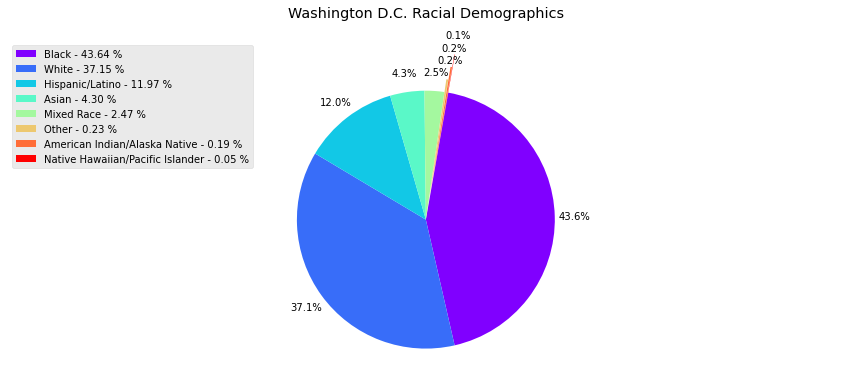

In [22]:
# autopct create %, start angle represent starting point
explode_list = [0, 0, 0, 0, 0, 0.1, 0.2, 0.3] # ratio for each race with which to offset each wedge.
x = df_sum_.index
y = df_sum_.values
percent = 100.*y/y.sum()
labels = ['{0} - {1:1.2f} %'.format(i,j) for i,j in zip(x, percent)]
df_sum_.plot(kind='pie',
             figsize=(15, 6),
             autopct='%1.1f%%', # add in percentages
             startangle=80,     # start angle 90° 
             shadow=False,       # add shadow    
             labels=None,         # turn off labels on pie chart
             pctdistance=1.15,    # the ratio between the center of each pie slice and the start of the text generated by autopct 
             cmap='rainbow',
             explode=explode_list, # 'explode' lowest 3
             counterclock=False,
             wedgeprops = {'linewidth': 3},
             rotatelabels = 90,
            )

plt.title('Washington D.C. Racial Demographics', y=1.05)
plt.axis('equal') # Sets the pie chart to look like a circle
pylab.ylabel('')

# add legend
plt.legend(labels=labels, loc='upper left')
plt.savefig('DCpie.png', transparent=True)
#plt.show()

***
The pie chart shows us that the racial make up of D.C. is majority Black people at 43.6%, then 37.1% White people, 12% Hispanic/Latino people, 4.3% Asian people, 2.5% mixed race people, and less than 1% combined American Indian/Alaska Natives, Native Hawaiian/Pacific Islanders, and people of other races. 
***

### Bar Chart of Total Population per Zip Code

In [23]:
# Sum up all columns with race information to get Total Population
col_list=list(df_clean) # Create column list of races
col_list.remove('Zip Code')
# Sum all the other columns and add in column: Total Population
df_tot['Total Population'] = df_tot[col_list].sum(axis=1)
df_tot.head()

,Zip Code,White,Black,American Indian/Alaska Native,Asian,Native Hawaiian/Pacific Islander,Other,Mixed Race,Hispanic/Latino,Median Household Income,Latitude,Longitude,Total Population
0,20001,21157,19410,106,4584,28,159,1577,6066,112940,38.907711,-77.01732,53087
1,20002,27906,35997,157,2224,68,165,1933,5460,101683,38.901811,-76.99097,73910
2,20003,20896,10161,106,1589,17,83,1023,3056,125361,38.881762,-76.99447,36931
3,20004,1143,132,6,330,3,0,70,172,149094,38.895268,-77.02760,1856
4,20005,9255,1782,24,1284,15,41,311,3043,111390,38.904461,-77.03088,15755


In [24]:
df_tot.tail()

,Zip Code,White,Black,American Indian/Alaska Native,Asian,Native Hawaiian/Pacific Islander,Other,Mixed Race,Hispanic/Latino,Median Household Income,Latitude,Longitude,Total Population
24,20064,756,276,7,39,1,1,43,143,59593,38.933161,-76.996348,1266
25,20319,68,17,0,6,0,0,1,5,85938,38.866924,-77.014240,97
26,20373,116,43,1,7,1,0,15,42,98864,38.893311,-77.014647,225
27,20374,1,2,0,1,0,0,0,0,137500,38.855522,-77.002197,4
28,20515,1,3,0,0,0,0,0,0,14999,38.893311,-77.014647,4


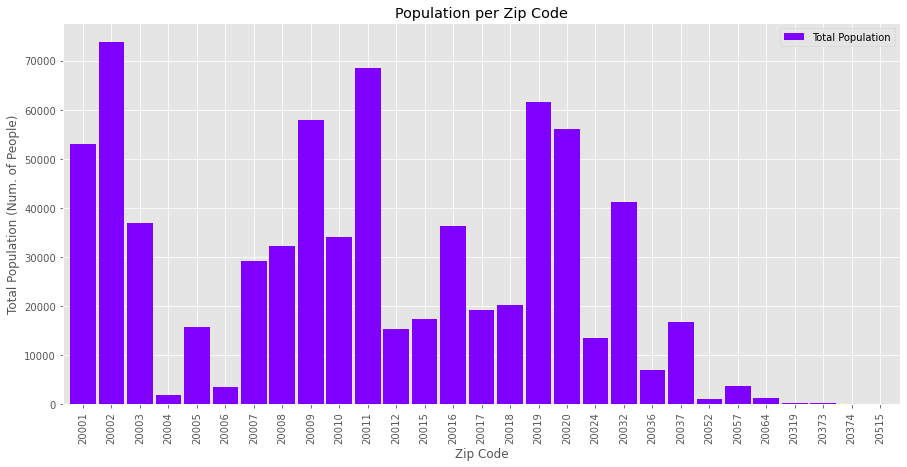

In [25]:
# Plot bar chart of total population vs. zip code
col_name = 'Total Population'
bars = df_tot['Zip Code'].values
y_pos = np.arange(len(bars))
df_tot[[col_name]].plot(kind='bar', figsize=(15, 7), cmap='rainbow', width=0.9)
plt.title('Population per Zip Code') # add a title to the histogram
plt.ylabel('Total Population (Num. of People)') # add y-label
plt.xlabel('Zip Code') # add x-label
plt.xticks(y_pos, bars)

plt.show()

***
The bar chart of the total population of each zip code shows us that the distribution of people across zip codes is very wide with some zip codes having more than 70,000 people while others have such low populations, they are not visible on the plot.
***

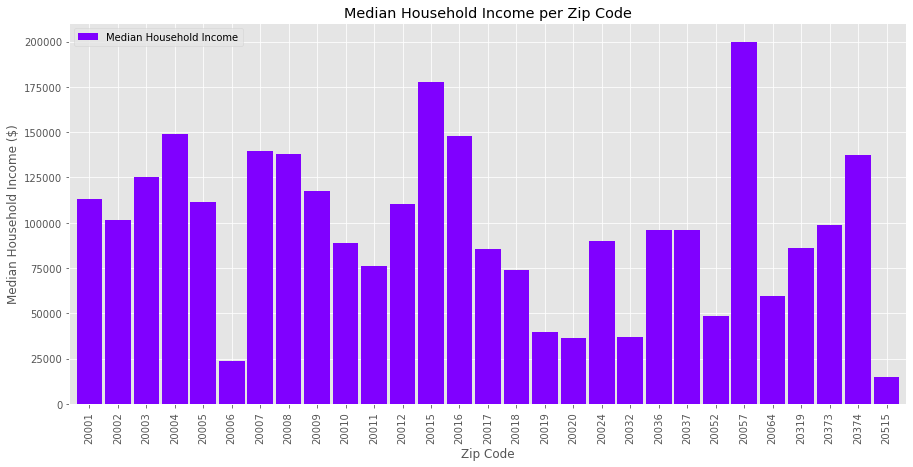

In [26]:
# Plot bar chart of median household income vs. zip code
col_name = 'Median Household Income'
bars = df_tot['Zip Code'].values
y_pos = np.arange(len(bars))
df_tot[[col_name]].plot(kind='bar', figsize=(15, 7), cmap='rainbow', width=0.9)
plt.title('Median Household Income per Zip Code') # add a title to the histogram
plt.ylabel('Median Household Income ($)') # add y-label
plt.xlabel('Zip Code') # add x-label
plt.xticks(y_pos, bars)

plt.show()

### Describe the data

In [27]:
col_list.append(col_name)
col_list.append('Median Household Income')
df_tot[col_list].describe()

,White,Black,American Indian/Alaska Native,Asian,Native Hawaiian/Pacific Islander,Other,Mixed Race,Hispanic/Latino,Median Household Income,Median Household Income
count,29.000000,29.000000,29.000000,29.000000,29.000000,29.000000,29.00000,29.000000,29.000000,29.000000
mean,9186.931034,10792.724138,47.379310,1062.413793,13.517241,57.758621,610.37931,2959.551724,97238.896552,97238.896552
std,10361.021399,16383.423002,48.161495,1172.737016,16.242846,56.667360,528.84844,4283.626189,45180.643160,45180.643160
min,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,14999.000000,14999.000000
25%,986.000000,262.000000,5.000000,191.000000,1.000000,3.000000,166.00000,334.000000,73771.000000,73771.000000
50%,4702.000000,1782.000000,31.000000,648.000000,6.000000,47.000000,532.00000,1557.000000,95997.000000,95997.000000
75%,12902.000000,11246.000000,71.000000,1589.000000,20.000000,85.000000,971.00000,3056.000000,125361.000000,125361.000000
max,34890.000000,56818.000000,157.000000,4584.000000,68.000000,204.000000,1933.00000,20169.000000,200000.000000,200000.000000


In [28]:
print('The minimum population for any zip code is',df_tot['Total Population'].min(),'in zip code',df_tot['Zip Code'].iloc[df_tot['Total Population'].idxmin()])
print('The maximum pouplation for any zip code is',df_tot['Total Population'].max(),'in zip code',df_tot['Zip Code'].iloc[df_tot['Total Population'].idxmax()])
print('')
print('The average values of each population are:')
df_tot[col_list].mean().sort_values(ascending=False)

The minimum population for any zip code is 4 in zip code 20374
The maximum pouplation for any zip code is 73910 in zip code 20002

The average values of each population are:


Median Household Income             97238.896552
Median Household Income             97238.896552
Black                               10792.724138
White                                9186.931034
Hispanic/Latino                      2959.551724
Asian                                1062.413793
Mixed Race                            610.379310
Other                                  57.758621
American Indian/Alaska Native          47.379310
Native Hawaiian/Pacific Islander       13.517241
dtype: float64

## Plot Map of D.C. with markers for each Zip Code

I wanted to plot a map of D.C. where the zip codes are both marked and colored by population so I could better understand how people were distributed across D.C.

In [29]:
import folium
print(folium.__version__)

0.11.0


In [30]:
zip_geo = r'zip-codes.geojson' 

In [31]:
dc_map = folium.Map(location=[38.9072, -77.0369], zoom_start=11.5)
threshold_scale = np.linspace(df_tot['Total Population'].min(),
                              df_tot['Total Population'].max(),
                              6, dtype=float)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1]  + .1 # make sure that the last value of the list is greater than the maximum
    
dc_map.choropleth(
    geo_data=zip_geo,
    data=df_tot,
    columns=['Zip Code', 'Total Population'],
    key_on='feature.properties.ZIPCODE',
    fill_color='BuPu', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name=('Total Population'),
    threshold_scale=threshold_scale,
    )
# add markers to map
for lat, lon, cluster in zip(df_tot['Latitude'], df_tot['Longitude'], df_tot['Zip Code']):
    label = folium.Popup(' Zip Code: ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=2,
        popup=label,
        color='yellow',
        fill=True,
        fill_color='yellow',
        fill_opacity=0.7).add_to(dc_map)
    
dc_map
#dc_map.save('dcpop.html')

C:\Users\kater\anaconda3\lib\site-packages\folium\folium.py:411: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


## Plot Bar Chart of Each Race per Zip Code

In [32]:
df_tot.head()

,Zip Code,White,Black,American Indian/Alaska Native,Asian,Native Hawaiian/Pacific Islander,Other,Mixed Race,Hispanic/Latino,Median Household Income,Latitude,Longitude,Total Population
0,20001,21157,19410,106,4584,28,159,1577,6066,112940,38.907711,-77.01732,53087
1,20002,27906,35997,157,2224,68,165,1933,5460,101683,38.901811,-76.99097,73910
2,20003,20896,10161,106,1589,17,83,1023,3056,125361,38.881762,-76.99447,36931
3,20004,1143,132,6,330,3,0,70,172,149094,38.895268,-77.02760,1856
4,20005,9255,1782,24,1284,15,41,311,3043,111390,38.904461,-77.03088,15755


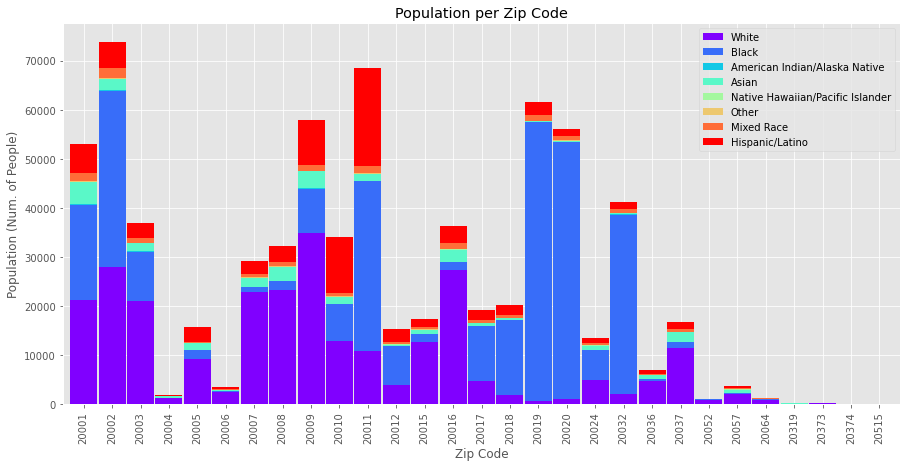

In [33]:
col_name = ['White', 'Black','American Indian/Alaska Native', 'Asian','Native Hawaiian/Pacific Islander','Other','Mixed Race','Hispanic/Latino']
#col_name=['Other']
bars = df_tot['Zip Code']
y_pos = np.arange(len(bars))
df_tot[col_name].plot(kind='bar', figsize=(15, 7), cmap='rainbow', width=0.95, stacked=True)
plt.title('Population per Zip Code') # add a title to the histogram
plt.ylabel('Population (Num. of People)') # add y-label
plt.xlabel('Zip Code') # add x-label
plt.xticks(y_pos, bars)
#plt.savefig('zip_race.png')
plt.show()

***
Plotting the population of each race on one scale makes the graph very difficult to read as the Black and White populations are more than 200 times the populations of Native Hawaiian and Native Alaskans. Therefore I decided to split this plot into 3 bar plots containing only the races that had similar magnitudes.
***

### Plot population of Zip Code as percentage of total population

In [34]:
test_list= ['White',
           'Black',
           'American Indian/Alaska Native',
           'Asian',
           'Native Hawaiian/Pacific Islander',
           'Other',
           'Mixed Race',
           'Hispanic/Latino']

In [35]:
df_perc = pd.DataFrame(index=df_tot.index)
df_perc['Zip Code'] = df_tot['Zip Code']
for item in test_list:
    df_perc[item] = df_tot[item].div(df_tot['Total Population'])
df_perc.head()

,Zip Code,White,Black,American Indian/Alaska Native,Asian,Native Hawaiian/Pacific Islander,Other,Mixed Race,Hispanic/Latino
0,20001,0.398534,0.365626,0.001997,0.086349,0.000527,0.002995,0.029706,0.114265
1,20002,0.377567,0.487038,0.002124,0.030091,0.000920,0.002232,0.026153,0.073874
2,20003,0.565812,0.275135,0.002870,0.043026,0.000460,0.002247,0.027700,0.082749
3,20004,0.615841,0.071121,0.003233,0.177802,0.001616,0.000000,0.037716,0.092672
4,20005,0.587433,0.113107,0.001523,0.081498,0.000952,0.002602,0.019740,0.193145


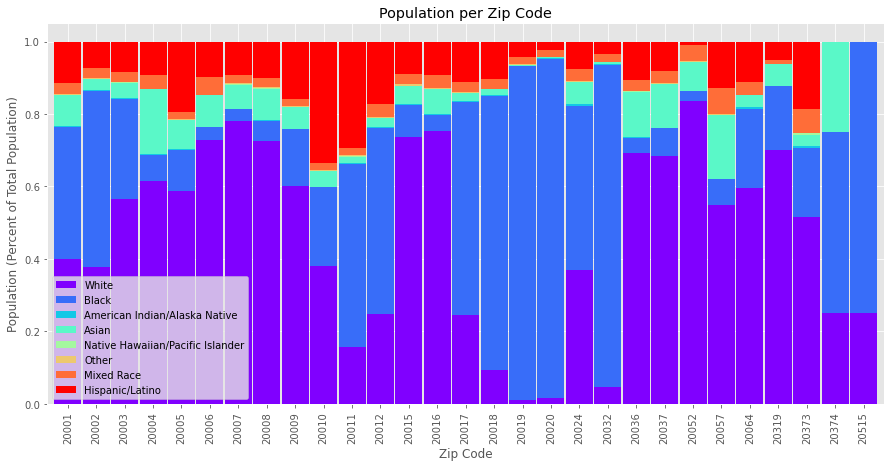

In [37]:
col_name = ['White', 'Black','American Indian/Alaska Native', 'Asian','Native Hawaiian/Pacific Islander','Other','Mixed Race','Hispanic/Latino']
#col_name=['Other']
bars = df_perc['Zip Code']
y_pos = np.arange(len(bars))
df_perc[col_name].plot(kind='bar', figsize=(15, 7), cmap='rainbow', width=0.95, stacked=True)
plt.title('Population per Zip Code') # add a title to the histogram
plt.ylabel('Population (Percent of Total Population)') # add y-label
plt.xlabel('Zip Code') # add x-label
plt.xticks(y_pos, bars)
plt.savefig('zip_race_perc.png', transparent=False)
#plt.show()

### Plot of White, Black, and Hispanic/Latino Populations per Cluster

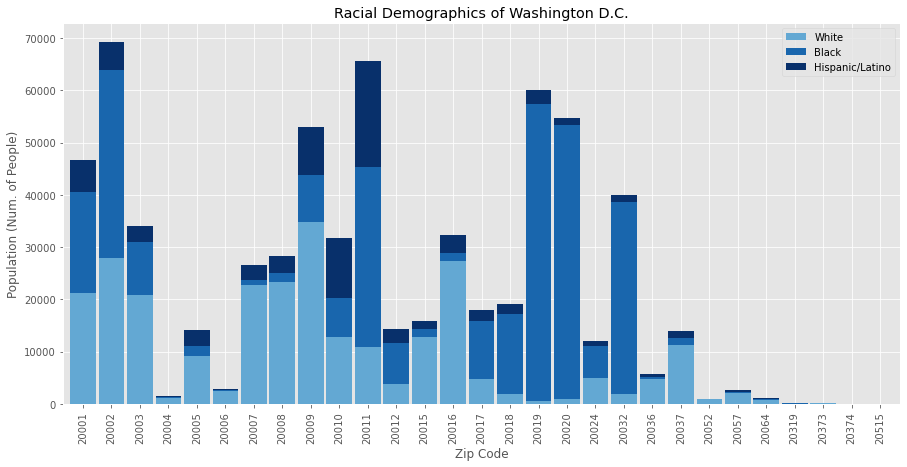

In [37]:
col_name =['White','Black', 'Hispanic/Latino']

bars = df_tot['Zip Code']
y_pos = np.arange(len(bars))

cmap = mpl.cm.Blues(np.linspace(0,1,20))
cmap = mpl.colors.ListedColormap(cmap[10:,:-1])

df_tot[col_name].plot(kind='bar', figsize=(15, 7), width=0.9, align='center', cmap=cmap, stacked=True)

plt.title('Racial Demographics of Washington D.C.') # add a title to the histogram
plt.ylabel('Population (Num. of People)') # add y-label
plt.xlabel('Zip Code') # add x-label

plt.xticks(y_pos, bars)

plt.show()

***
There are only a few zip codes that have similar distributions between Black, White, and Hispanic/Latino populations, while most zip codes have majority White or majority Black populations.<br>
<br>
Majority White Zip Codes: 20003 through 20009, 20015, 20016 , 20036, 20037, 20057 <br>
Majority Black Zip Codes: 20002, 20011, 20017 through 20020, 20032<br>
<br>
The Hispanic/Latino population is on average lower than the Black or White populations, but is most concentrated around zip codes 20009 through 20011.<br>
<br>
The low population zip codes mirror those of the total population.
***

### Plot of Asian and Mixed Race Populations per Cluster

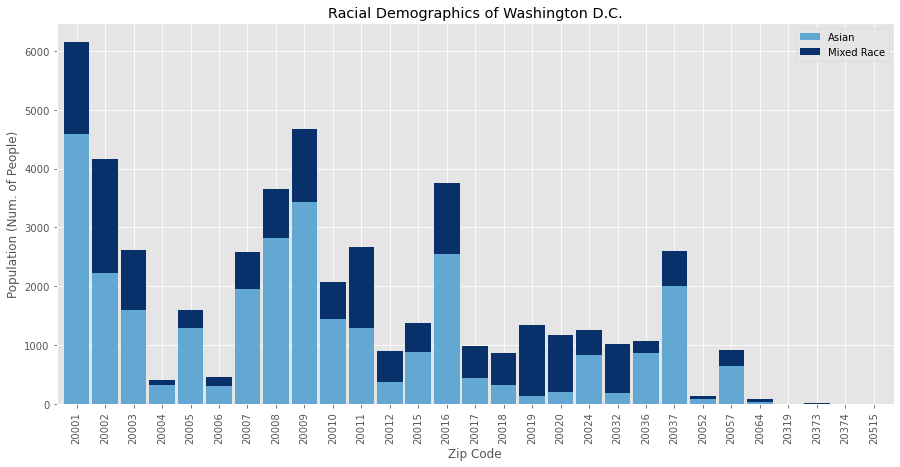

In [38]:
col_name =['Asian','Mixed Race' ]

bars = df_tot['Zip Code']
y_pos = np.arange(len(bars))

cmap = mpl.cm.Blues(np.linspace(0,1,20))
cmap = mpl.colors.ListedColormap(cmap[10:,:-1])

df_tot[col_name].plot(kind='bar', figsize=(15, 7), width=0.9, align='center', cmap=cmap, stacked=True)

plt.title('Racial Demographics of Washington D.C.') # add a title to the histogram
plt.ylabel('Population (Num. of People)') # add y-label
plt.xlabel('Zip Code') # add x-label
plt.xticks(y_pos, bars)

plt.show()

***
On average, there are more Asian people than Mixed Race. Only zip codes 20019, 20020, and 20032 have significantly more Mixed Race people than Asian. The overall pattern of the populations (where there is a high population vs. a low one) follows the same pattern as the total population of all races, so the finding here are not that significant.
***

### Plot of American Indian/Alaska Native, Native Hawaiian/Pacific Islander, and Othe Race Populations per Cluster

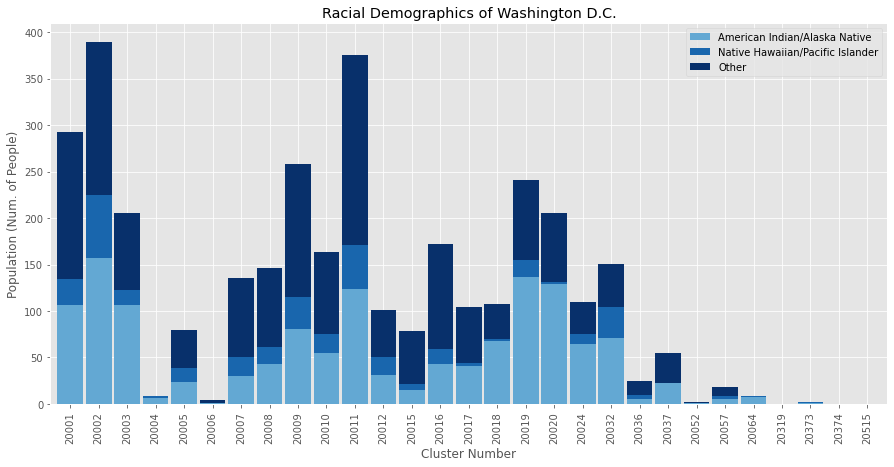

In [39]:
col_name =['American Indian/Alaska Native','Native Hawaiian/Pacific Islander','Other']

bars = df_tot['Zip Code']
y_pos = np.arange(len(bars))

cmap = mpl.cm.Blues(np.linspace(0,1,20))
cmap = mpl.colors.ListedColormap(cmap[10:,:-1])

df_tot[col_name].plot(kind='bar', figsize=(15, 7), width=0.9, align='center', cmap=cmap, stacked=True)

#plt.title('Racial Demographics of Washington D.C.') # add a title to the histogram
plt.title('Racial Demographics of Washington D.C.') # add a title to the histogram
plt.ylabel('Population (Num. of People)') # add y-label
plt.xlabel('Cluster Number') # add x-label
plt.xticks(y_pos, bars)

plt.show()

***
These are the smallest populations in our dataset. The patter of high population vs. low population again follows the general trend of the total population for all races. The Native Hawaiian/Pacific Islander population is still very small and sometime difficult to see even on this reduced y-axis range.
***

In [40]:
# Get hex codes for colors in cmap
from pylab import *

cmap = cm.get_cmap('Blues', 20)    # PiYG

for i in range(cmap.N):
    rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
    print(matplotlib.colors.rgb2hex(rgb))

#f7fbff
#ecf4fc
#e2eef8
#d8e7f5
#cee0f2
#c2d9ee
#b1d2e8
#a0cbe2
#8bc0dd
#76b4d8
#62a8d3
#519ccc
#4090c5
#3282be
#2474b7
#1967ad
#0f59a3
#084c94
#083e80
#08306b


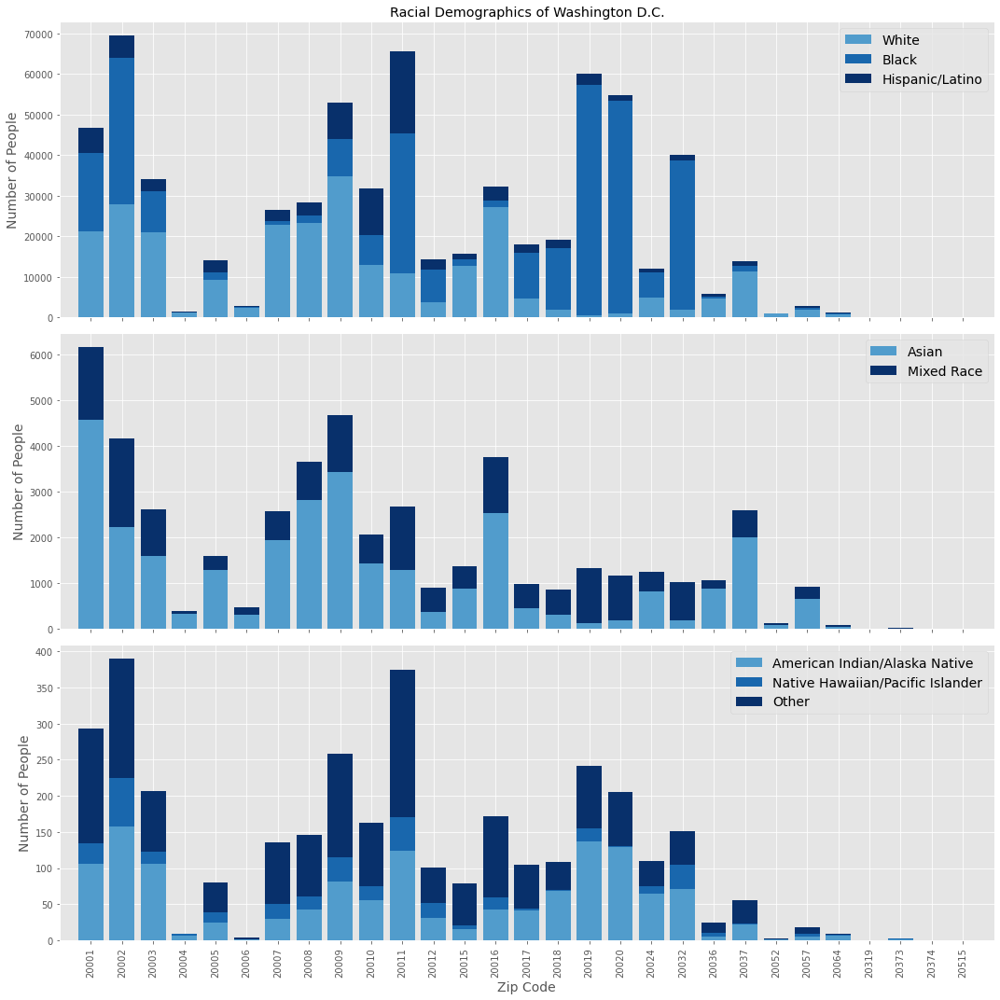

In [41]:
# Plot all three stacked
import numpy as np
import matplotlib.pyplot as plt

bars = df_tot['Zip Code']
y_pos = np.arange(len(bars))

#np.random.seed(19680801)

#n_bins = 10
#x = np.random.randn(1000, 3)

fig, ax = plt.subplots(3, figsize=(15, 15), sharex='col')

ax[0].bar(y_pos-0, df_tot['White'], label='White', color='#519ccc', width=0.8)
ax[0].bar(y_pos+0, df_tot['Black'], label='Black', color='#1967ad', width=0.8, bottom=df['White'])
ax[0].bar(y_pos+0, df_tot['Hispanic/Latino'], label='Hispanic/Latino', color='#08306b', width=0.8, bottom=(df['White']+df['Black']))
ax[0].legend(prop={'size': 14})
ax[0].set_xticklabels(bars, rotation=90)
ax[0].set_title('Racial Demographics of Washington D.C.')
ax[0].set_xticks(y_pos)
ax[0].set_ylabel('Number of People',fontsize='14')

ax[1].bar(y_pos-0, df_tot['Asian'], label='Asian', color='#519ccc', width=0.8)
ax[1].bar(y_pos+0, df_tot['Mixed Race'], label='Mixed Race', color='#08306b', width=0.8, bottom=df['Asian'])
ax[1].legend(prop={'size': 14})
ax[1].set_xticklabels(bars, rotation = 90)
ax[1].set_xticks(y_pos)
ax[1].set_ylabel('Number of People',fontsize='14')

ax[2].bar(y_pos-0, df_tot['American Indian/Alaska Native'], label='American Indian/Alaska Native', color='#519ccc', width=0.8)
ax[2].bar(y_pos+0, df_tot['Native Hawaiian/Pacific Islander'], label='Native Hawaiian/Pacific Islander', color='#1967ad', width=0.8, bottom=df_tot['American Indian/Alaska Native'])
ax[2].bar(y_pos+0, df_tot['Other'], label='Other', color='#08306b', width=0.8, bottom=(df_tot['American Indian/Alaska Native']+df_tot['Native Hawaiian/Pacific Islander']))
ax[2].legend(prop={'size': 14})
ax[2].set_xticklabels(bars, rotation = 90)
ax[2].set_xticks(y_pos)
ax[2].set_xlim(-1, 29)
ax[2].set_ylabel('Number of People',fontsize='14')
ax[2].set_xlabel('Zip Code',fontsize='14')

fig.tight_layout()
plt.show()
#plt.savefig('races.png')

## Analysis of Community Resources for Each Zip Code

In [42]:
print('There are {} total venues.'.format(dc_venues['Venue'].count()))

There are 1081 total venues.


In [43]:
print('There are {} uniques categories.'.format(len(dc_venues['Venue Category'].unique())))

There are 233 uniques categories.


### Group venues in to resource categories:
1. Athletic facilities
2. Restaurants
3. Grocery Stores
4. Educational Opportunities
5. Fast Food Places

In [44]:
# Selection of keywords that indicate relationship to one of the five categories
sport = 'Bike|Tennis|Recreation|Yoga|Field|Skate|Pool|Park|Martial Arts|Gym|Dance'
rest = 'Restaurant|Steakhouse|Noodle|Diner'
grocery = 'Grocery|Supermarket|Fish Market|Farmers Market|Bodega'
educ = 'College|Student|Bookstore|Museum'
fastfood = 'Fast Food|Food Truck|Joint|Place'

In [45]:
# Create new DataFrame for each category
df_temprest = dc_venues[dc_venues['Venue Category'].str.contains(rest)]
df_sport = dc_venues[dc_venues['Venue Category'].str.contains(sport)]
df_grocery = dc_venues[dc_venues['Venue Category'].str.contains(grocery)]
df_educ = dc_venues[dc_venues['Venue Category'].str.contains(educ)]
df_fastfood = dc_venues[dc_venues['Venue Category'].str.contains(fastfood)]

In [46]:
# Remove Fast Food restaurants from Restaurants DataFrame
reduce_rest = 'Fast Food'
df_rest = df_temprest[~df_temprest['Venue Category'].str.contains(reduce_rest)]

### Count the number of venues for each category type

In [47]:
# Function to count number of venues per zip code and drop irrelevant columns
def count_venues(frame,col):
    count = frame.groupby('Zip Code').count()
    count.drop(columns=['Zip Code Latitude','Zip Code Longitude','Venue','Venue Latitude', 'Venue Longitude'], inplace=True)
    count.rename(columns={'Venue Category':col}, inplace=True)
    
    return count

In [48]:
# Call function for each type of venue
sport_count = count_venues(df_sport,'Athletics')
rest_count = count_venues(df_rest,'Restaurants')
grocery_count = count_venues(df_grocery,'Grocery Stores')
educ_count = count_venues(df_educ,'Education')
fastfood_count = count_venues(df_fastfood,'Fast Food')

### Merge all venue category count dataframes into one venue count dataframe

In [49]:
# import reduce library so I can merge all dataframes at once
from functools import reduce

In [50]:
# Merging dataframes into singular venue count dataframe
dfs = [sport_count, rest_count, grocery_count, educ_count, fastfood_count] # dataframes to be merged
nan_value = 0 # replace any NaN values with zero

venue_count = reduce(lambda df_left,df_right: pd.merge(df_left, df_right, 
                                                    left_index=True, right_index=True, 
                                                    how='outer'), dfs).fillna(nan_value).astype('int64')
venue_count.head()

,Athletics,Restaurants,Grocery Stores,Education,Fast Food
Zip Code,,,,,
20001,2,2,1,0,1
20002,5,16,2,2,9
20003,2,18,1,2,5
20004,2,21,2,13,14
20005,4,28,4,0,9


### Merge Venue Count DataFrame with all Zip Code DataFrame

In [51]:
# Merge venue_count dataframe with the rest of the zip code data
df_complete = pd.merge(df_tot, venue_count, on='Zip Code', how='left').fillna(nan_value) # merge columns

In [52]:
# View complete dataframe
df_complete.head()

,Zip Code,White,Black,American Indian/Alaska Native,Asian,Native Hawaiian/Pacific Islander,Other,Mixed Race,Hispanic/Latino,Median Household Income,Latitude,Longitude,Total Population,Athletics,Restaurants,Grocery Stores,Education,Fast Food
0,20001,21157,19410,106,4584,28,159,1577,6066,112940,38.907711,-77.01732,53087,2,2,1,0,1
1,20002,27906,35997,157,2224,68,165,1933,5460,101683,38.901811,-76.99097,73910,5,16,2,2,9
2,20003,20896,10161,106,1589,17,83,1023,3056,125361,38.881762,-76.99447,36931,2,18,1,2,5
3,20004,1143,132,6,330,3,0,70,172,149094,38.895268,-77.02760,1856,2,21,2,13,14
4,20005,9255,1782,24,1284,15,41,311,3043,111390,38.904461,-77.03088,15755,4,28,4,0,9


In [53]:
# Find total number of venues per type
venue_list=['Athletics','Restaurants','Grocery Stores', 'Education', 'Fast Food']
df_complete[venue_list].sum().sort_values(ascending=False)

Restaurants       245
Fast Food         131
Athletics          77
Education          42
Grocery Stores     42
dtype: int64

## Plot Number of Venues per Zip Code

In [54]:
# Calculate the total number of venues
df_complete['Total Venues'] = df_complete[venue_list].sum(axis=1)
df_complete.head()

,Zip Code,White,Black,American Indian/Alaska Native,Asian,Native Hawaiian/Pacific Islander,Other,Mixed Race,Hispanic/Latino,Median Household Income,Latitude,Longitude,Total Population,Athletics,Restaurants,Grocery Stores,Education,Fast Food,Total Venues
0,20001,21157,19410,106,4584,28,159,1577,6066,112940,38.907711,-77.01732,53087,2,2,1,0,1,6
1,20002,27906,35997,157,2224,68,165,1933,5460,101683,38.901811,-76.99097,73910,5,16,2,2,9,34
2,20003,20896,10161,106,1589,17,83,1023,3056,125361,38.881762,-76.99447,36931,2,18,1,2,5,28
3,20004,1143,132,6,330,3,0,70,172,149094,38.895268,-77.02760,1856,2,21,2,13,14,52
4,20005,9255,1782,24,1284,15,41,311,3043,111390,38.904461,-77.03088,15755,4,28,4,0,9,45


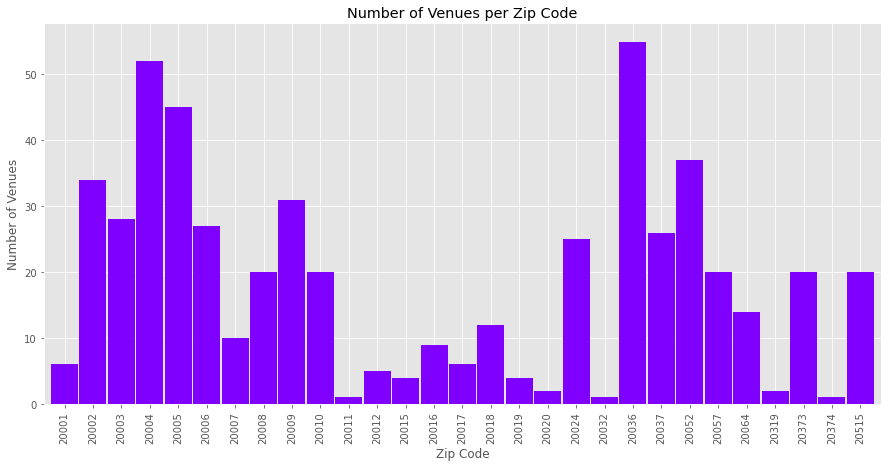

In [55]:
# Plot total number of venues per zip code
bars = df_complete['Zip Code']
y_pos = np.arange(len(bars))
df_complete['Total Venues'].plot(kind='bar', figsize=(15, 7), cmap='rainbow', width=0.95)
plt.title('Number of Venues per Zip Code') # add a title to the histogram
plt.ylabel('Number of Venues') # add y-label
plt.xlabel('Zip Code') # add x-label
plt.xticks(y_pos, bars)

plt.show()

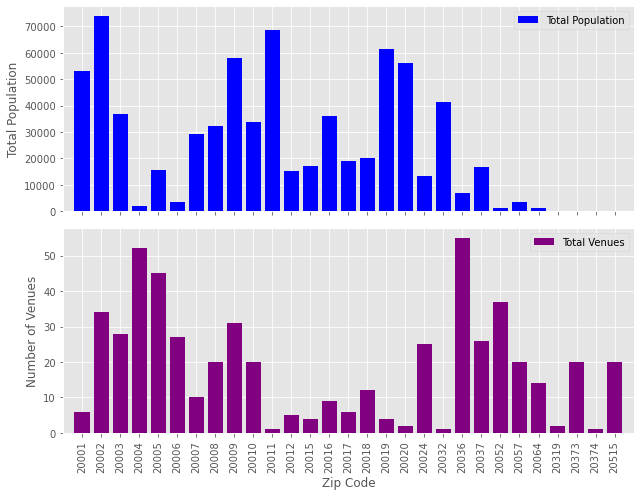

In [56]:
# Plot Total Population and Total Venues together
import numpy as np
import matplotlib.pyplot as plt

bars = df_complete['Zip Code']
y_pos = np.arange(len(bars))

fig, ax = plt.subplots(2, figsize=(9, 7), sharex='col')

ax[0].bar(y_pos, df_complete['Total Population'], label='Total Population',color='blue')
ax[0].legend(prop={'size': 10})
#ax[0].set_title('Total Population compared with Total Number of Venues per Zip Code')
ax[0].set_xticklabels(bars, rotation = 90)
ax[0].set_xticks(y_pos)
ax[0].set_ylabel('Total Population')

ax[1].bar(y_pos, df_complete['Total Venues'], label='Total Venues', color='purple')
ax[1].legend(prop={'size': 10})
ax[1].set_xticklabels(bars, rotation=90)
ax[1].set_xticks(y_pos)
ax[1].set_xlim(-1, 29)
ax[1].set_ylabel('Number of Venues')
ax[1].set_xlabel('Zip Code')

fig.tight_layout()
#plt.savefig('popvsven.png')
plt.show()

***
We can see from the plot that the total number of venues per zip code actually seems to be inverse of the total population. Zip codes with low populations have a high number of venues, while zip codes with higher populations have less venues. This is bad because it means that the resources are not being distributed to the communities that need them.
***

## Correlations between Variables

In [57]:
# Calculate the pearson coefficient for each correlations
df_complete.corr()

,Zip Code,White,Black,American Indian/Alaska Native,Asian,Native Hawaiian/Pacific Islander,Other,Mixed Race,Hispanic/Latino,Median Household Income,Latitude,Longitude,Total Population,Athletics,Restaurants,Grocery Stores,Education,Fast Food,Total Venues
Zip Code,1.000000,-0.406389,-0.280137,-0.434036,-0.407881,-0.374037,-0.463917,-0.507270,-0.316166,-0.185785,-0.360020,0.120992,-0.472341,0.167416,-0.231897,-0.086025,-0.127535,-0.093728,-0.165509
White,-0.406389,1.000000,-0.001029,0.413061,0.888849,0.635040,0.739603,0.704532,0.460546,0.424343,0.322149,-0.427189,0.595214,0.079225,0.191273,0.330868,-0.127611,-0.086941,0.101007
Black,-0.280137,-0.001029,1.000000,0.857059,-0.001554,0.503326,0.529258,0.659772,0.339284,-0.415068,-0.210740,0.662658,0.787032,-0.348091,-0.297827,-0.353932,-0.269149,-0.337121,-0.375937
American Indian/Alaska Native,-0.434036,0.413061,0.857059,1.000000,0.385747,0.719340,0.800902,0.893208,0.544931,-0.182162,-0.037438,0.490643,0.935054,-0.221099,-0.120011,-0.167031,-0.271782,-0.296281,-0.234550
Asian,-0.407881,0.888849,-0.001554,0.385747,1.000000,0.539573,0.714748,0.683892,0.452620,0.391068,0.268522,-0.393800,0.548688,0.080339,0.172327,0.310962,-0.135831,-0.077744,0.089746
Native Hawaiian/Pacific Islander,-0.374037,0.635040,0.503326,0.719340,0.539573,1.000000,0.840035,0.828813,0.678071,0.064279,0.153401,0.051520,0.814946,-0.062315,0.055053,0.018261,-0.193778,-0.140079,-0.046201
Other,-0.463917,0.739603,0.529258,0.800902,0.714748,0.840035,1.000000,0.932577,0.812213,0.119241,0.338456,-0.007322,0.916428,-0.204117,-0.104400,-0.021687,-0.294688,-0.349815,-0.228512
Mixed Race,-0.507270,0.704532,0.659772,0.893208,0.683892,0.828813,0.932577,1.000000,0.605625,0.057969,0.163504,0.140501,0.954798,-0.152998,-0.112315,-0.072186,-0.251818,-0.294698,-0.209645
Hispanic/Latino,-0.316166,0.460546,0.339284,0.544931,0.452620,0.678071,0.812213,0.605625,1.000000,0.020538,0.404977,-0.048695,0.670426,-0.167707,-0.017858,-0.054851,-0.250492,-0.286364,-0.154725
Median Household Income,-0.185785,0.424343,-0.415068,-0.182162,0.391068,0.064279,0.119241,0.057969,0.020538,1.000000,0.288376,-0.450181,-0.078792,0.025867,0.097728,0.258974,0.109396,0.000422,0.101072


### Calculate the Pearson Correlation Coefficient and P-value for each Race vs. Median Household Income

<p3>Pearson Correlation</p>
<p>The Pearson Correlation measures the linear dependence between two variables X and Y.</p>
<p>The resulting coefficient is a value between -1 and 1 inclusive, where:</p>
<ul>
    <li><b>1</b>: Total positive linear correlation.</li>
    <li><b>0</b>: No linear correlation, the two variables most likely do not affect each other.</li>
    <li><b>-1</b>: Total negative linear correlation.</li>
</ul>

By convention, when the
<ul>
    <li>p-value is $<$ 0.001: we say there is strong evidence that the correlation is significant.</li>
    <li>the p-value is $<$ 0.05: there is moderate evidence that the correlation is significant.</li>
    <li>the p-value is $<$ 0.1: there is weak evidence that the correlation is significant.</li>
    <li>the p-value is $>$ 0.1: there is no evidence that the correlation is significant.</li>
</ul>

In [58]:
from scipy import stats

In [59]:
pearson_coef, p_value = stats.pearsonr(df_complete['Total Population'], df_complete['Total Venues'])
print("Total Population: Total Venues", "The Pearson Correlation Coefficient for is", '{:.3}'.format(pearson_coef), " with a P-value of P =", '{:.3}'.format(p_value))

Total Population: Total Venues The Pearson Correlation Coefficient for is -0.25  with a P-value of P = 0.19


In [60]:
col_name = ['White', 'Black','American Indian/Alaska Native', 'Asian','Native Hawaiian/Pacific Islander','Other','Mixed Race','Hispanic/Latino']
for i in col_name:
    pearson_coef, p_value = stats.pearsonr(df_complete[i], df_complete['Median Household Income'])
    if p_value<0.001:
        print("STRONG:",i,": Median Household Income", "The Pearson Correlation Coefficient for is", '{:.3}'.format(pearson_coef), " with a P-value of P =", '{:.3}'.format(p_value))
    elif p_value<0.05:
        print("MODERATE:", i,": Median Household Income", "The Pearson Correlation Coefficient for is", '{:.3}'.format(pearson_coef), " with a P-value of P =", '{:.3}'.format(p_value))
    elif p_value <0.1:
        print("WEAK:",i,": Median Household Income", "The Pearson Correlation Coefficient for is", '{:.3}'.format(pearson_coef), " with a P-value of P =", '{:.3}'.format(p_value))
    else:
        print("NONE:",i,": Median Household Income", "The Pearson Correlation Coefficient for is", '{:.3}'.format(pearson_coef), " with a P-value of P =", '{:.3}'.format(p_value))

MODERATE: White : Median Household Income The Pearson Correlation Coefficient for is 0.424  with a P-value of P = 0.0218
MODERATE: Black : Median Household Income The Pearson Correlation Coefficient for is -0.415  with a P-value of P = 0.0252
NONE: American Indian/Alaska Native : Median Household Income The Pearson Correlation Coefficient for is -0.182  with a P-value of P = 0.344
MODERATE: Asian : Median Household Income The Pearson Correlation Coefficient for is 0.391  with a P-value of P = 0.0359
NONE: Native Hawaiian/Pacific Islander : Median Household Income The Pearson Correlation Coefficient for is 0.0643  with a P-value of P = 0.74
NONE: Other : Median Household Income The Pearson Correlation Coefficient for is 0.119  with a P-value of P = 0.538
NONE: Mixed Race : Median Household Income The Pearson Correlation Coefficient for is 0.058  with a P-value of P = 0.765
NONE: Hispanic/Latino : Median Household Income The Pearson Correlation Coefficient for is 0.0205  with a P-value o

***
**Not Statistically Significant**<br>
The P-values indicate no evidence that the correlations is significant between the median household income and the following races:
<ul><li>American Indian/Alaska Native</li>
    <li>Native Hawaiian/Pacific Islander</li>
    <li>Hispanic/Latino</li>
    <li>Mixed Race</li>
    <li>Other Races</li></ul>
    
**Moderate Significance**<br>
The P-values show there is moderate evidence that the correlation is significant between the median household income and the following races:
<ul><li>White: Correlation is 0.42 which indicates moderate positive correlation</li>
    <li>Black: Correlation is -0.42 which indicates moderate negative correlation</li>
    <li>Asian: Correlation is 0.39 which indicates moderate positive correlation</li></ul>

***

In [61]:
import seaborn as sns

(0.0, 209250.05)

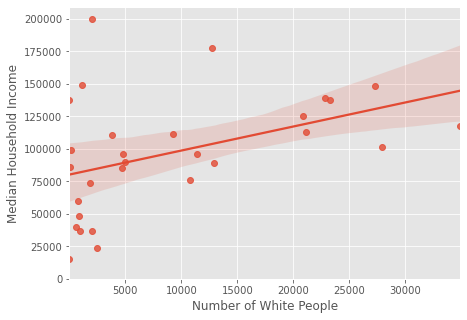

In [62]:
# Plot correlation of number of white people with median household income
width = 7
height = 5
plt.figure(figsize=(width, height))
ax = sns.regplot(x="White", y="Median Household Income", data=df_complete)
ax.set(xlabel='Number of White People', ylabel='Median Household Income')
plt.ylim(0,)
#plt.savefig('white_mhi_corr.png')

(0.0, 209250.05)

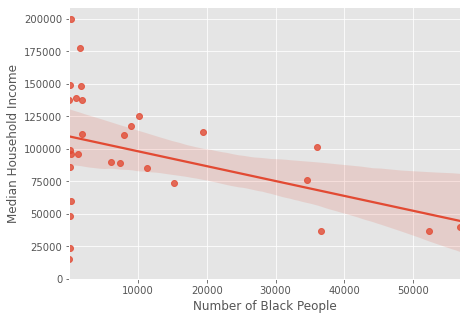

In [63]:
# Plot correlation of number of Black people with median household income
width = 7
height = 5
plt.figure(figsize=(width, height))
ax = sns.regplot(x="Black", y="Median Household Income", data=df_complete)
ax.set(xlabel='Number of Black People', ylabel='Median Household Income')
plt.ylim(0,)
#plt.savefig('black_mhi_corr.png')

(0.0, 217216.01765295627)

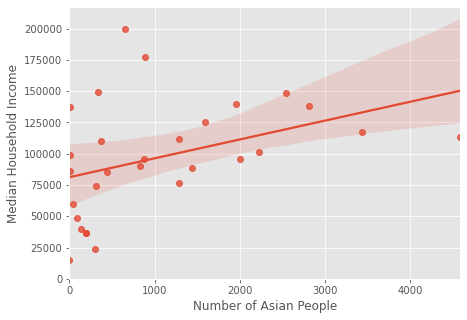

In [64]:
# Plot correlation of number of Asian people with median household income
width = 7
height = 5
plt.figure(figsize=(width, height))
ax = sns.regplot(x="Asian", y="Median Household Income", data=df_complete)
ax.set(xlabel='Number of Asian People', ylabel='Median Household Income')
plt.ylim(0,)
#plt.savefig('asian_mhi_corr.png')

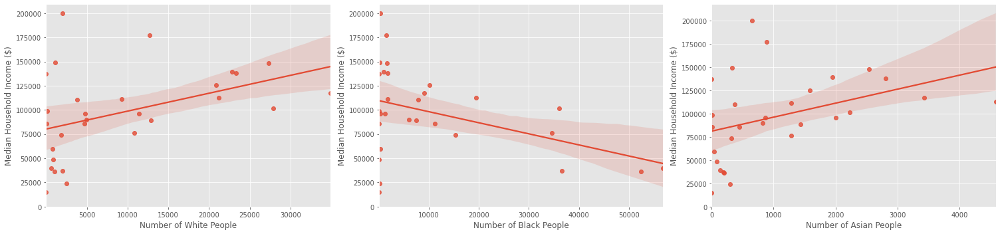

In [65]:
# Plot correlation of number of white people with median household income

width = 7
height = 5
data=df_complete

fig, axs = plt.subplots(ncols=3, nrows=1, figsize=(width*3, height))
 
sns.regplot(x="White", y="Median Household Income", data=df_complete, ax=axs[0])
axs[0].set(xlabel='Number of White People', ylabel='Median Household Income ($)',  )
axs[0].set_ylim(0,)

sns.regplot(x="Black", y="Median Household Income", data=df_complete, ax=axs[1])
axs[1].set(xlabel='Number of Black People', ylabel='Median Household Income ($)', )
axs[1].set_ylim(0,)

sns.regplot(x="Asian", y="Median Household Income", data=df_complete, ax=axs[2])
axs[2].set(xlabel='Number of Asian People', ylabel='Median Household Income ($)', )
axs[2].set_ylim(0,)

fig.tight_layout()
#plt.savefig('all_mhi_corr2.png')

In [66]:
col_name = ['Athletics', 'Restaurants','Grocery Stores', 'Education','Fast Food', 'Total Venues']

for i in col_name:
    pearson_coef, p_value = stats.pearsonr(df_complete[i], df_complete['Median Household Income'])
    if p_value<0.001:
        print("STRONG:",i,": Median Household Income",  "The Pearson Correlation Coefficient for is", '{:.3}'.format(pearson_coef), " with a P-value of P =", '{:.3}'.format(p_value))
    elif p_value<0.05:
        print("MODERATE:", i,": Median Household Income"," The Pearson Correlation Coefficient for is", '{:.3}'.format(pearson_coef), " with a P-value of P =", '{:.3}'.format(p_value))
    elif p_value <0.1:
        print("WEAK:",i,": Median Household Income"," The Pearson Correlation Coefficient for is", '{:.3}'.format(pearson_coef), " with a P-value of P =", '{:.3}'.format(p_value))
    else:
        print("NONE:",i,": Median Household Income"," The Pearson Correlation Coefficient for is", '{:.3}'.format(pearson_coef), " with a P-value of P =", '{:.3}'.format(p_value))

NONE: Athletics : Median Household Income  The Pearson Correlation Coefficient for is 0.0259  with a P-value of P = 0.894
NONE: Restaurants : Median Household Income  The Pearson Correlation Coefficient for is 0.0977  with a P-value of P = 0.614
NONE: Grocery Stores : Median Household Income  The Pearson Correlation Coefficient for is 0.259  with a P-value of P = 0.175
NONE: Education : Median Household Income  The Pearson Correlation Coefficient for is 0.109  with a P-value of P = 0.572
NONE: Fast Food : Median Household Income  The Pearson Correlation Coefficient for is 0.000422  with a P-value of P = 0.998
NONE: Total Venues : Median Household Income  The Pearson Correlation Coefficient for is 0.101  with a P-value of P = 0.602


***
The P-values indicate that there is no evidence of statistical significance to any of the correlations between Median Household Income and any of the venue categories.
***

In [67]:
col_name = ['Athletics', 'Restaurants','Grocery Stores', 'Education','Fast Food', 'Total Venues']
col_name2 = ['White', 'Black','American Indian/Alaska Native', 'Asian','Native Hawaiian/Pacific Islander','Other','Mixed Race','Hispanic/Latino', 'Total Population']
for j in col_name:
    for i in col_name2:
        pearson_coef, p_value = stats.pearsonr(df_complete[i], df_complete[j])
        if p_value<0.001:
            print("STRONG:",i,":",j," The Pearson Correlation Coefficient for is", '{:.3}'.format(pearson_coef), " with a P-value of P =", '{:.3}'.format(p_value))
        elif p_value<0.05:
            print("MODERATE:", i,":",j," The Pearson Correlation Coefficient for is", '{:.3}'.format(pearson_coef), " with a P-value of P =", '{:.3}'.format(p_value))

        elif p_value <0.1:
            print("WEAK:",i,":",j," The Pearson Correlation Coefficient for is", '{:.3}'.format(pearson_coef), " with a P-value of P =", '{:.3}'.format(p_value))
        """Decided to cut out the NONE results to reduce clutter
        else:
            print("NONE:",i,":",j," The Pearson Correlation Coefficient for is", '{:.3}'.format(pearson_coef), " with a P-value of P =", '{:.3}'.format(p_value))
        #    """

WEAK: Black : Athletics  The Pearson Correlation Coefficient for is -0.348  with a P-value of P = 0.0643
WEAK: White : Grocery Stores  The Pearson Correlation Coefficient for is 0.331  with a P-value of P = 0.0796
WEAK: Black : Grocery Stores  The Pearson Correlation Coefficient for is -0.354  with a P-value of P = 0.0596
WEAK: Black : Fast Food  The Pearson Correlation Coefficient for is -0.337  with a P-value of P = 0.0737
WEAK: Other : Fast Food  The Pearson Correlation Coefficient for is -0.35  with a P-value of P = 0.0629
WEAK: Total Population : Fast Food  The Pearson Correlation Coefficient for is -0.342  with a P-value of P = 0.0693
MODERATE: Black : Total Venues  The Pearson Correlation Coefficient for is -0.376  with a P-value of P = 0.0444


***
We see only moderate or weak evidence of any correlation between variables in the dataset. One noticeable results is that the only positive correlation in the dataset is between the number of White people in a zip code and the number of grocery stores in that zip code. With a p-value of 0.08, there is weak evidence of this correlation, and the correlation coefficent is only 0.33. However, we see moderate evidence that there is a negative correlation between the number of Black people in a zip code and the number of grocery stores. This could indicate that the number of grocery stores in those zip codes are not meeting the needs of that community, and thus they do not have equal access to fresh and health food options. However, since the evidence is only moderate, and correlation is also moderate at -0.38, this would need to be studied further to confirm conclusions.
***

[Text(0, 0.5, 'Number of Grocery Stores'), Text(0.5, 0, 'Population')]

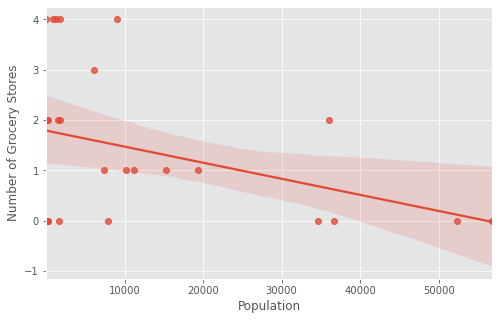

In [68]:
# Plot correlation of the Black population with the number of grocery stores
width = 8
height = 5
plt.figure(figsize=(width, height))
ax = sns.regplot(x="Black", y="Grocery Stores", data=df_complete)
ax.set(xlabel='Population', ylabel='Number of Grocery Stores')
#plt.ylim(0,)

## Venue Clustering

### Plot map of D.C. with markers for each venue colored by type:

<ul><li>Grocery Stores = Blue</li>
    <li>Fast Food Places = Yellow</li>
    <li>Restaurants = Red</li>
    <li>Educational Resources = Orange</li>
    <li>Athletic/Ourdoor Recreation = Green</li></ul>
    
The map is colored by the population of each zip code such that darker purple is more highly populated.

In [69]:
dc_map = folium.Map(location=[38.9072, -77.0369], zoom_start=11.5)

threshold_scale = np.linspace(df_tot['Total Population'].min(),
                              df_tot['Total Population'].max(),
                              6, dtype=float)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1]  + .1 # make sure that the last value of the list is greater than the maximum

dc_map.choropleth(
    geo_data=zip_geo,
    data=df_complete,
    columns=['Zip Code', 'Total Population'],
    key_on='feature.properties.ZIPCODE',
    fill_color='BuPu', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name=('Total Population'),
    threshold_scale=threshold_scale,
    )


# add markers to map
for lat, lng, venue, venue_category in zip(df_grocery['Venue Latitude'], df_grocery['Venue Longitude'], df_grocery['Venue'], df_grocery['Venue Category']):
    label = '{}, {}'.format(venue, venue_category)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.7,
        parse_html=False).add_to(dc_map)
    
    
for lat, lng, venue, venue_category in zip(df_fastfood['Venue Latitude'], df_fastfood['Venue Longitude'], df_fastfood['Venue'], df_fastfood['Venue Category']):
    label = '{}, {}'.format(venue, venue_category)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.7,
        parse_html=False).add_to(dc_map)
    
    
for lat, lng, venue, venue_category in zip(df_rest['Venue Latitude'], df_rest['Venue Longitude'], df_rest['Venue'], df_rest['Venue Category']):
    label = '{}, {}'.format(venue, venue_category)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='yellow',
        fill=True,
        fill_color='yellow',
        fill_opacity=0.7,
        parse_html=False).add_to(dc_map)


for lat, lng, venue, venue_category in zip(df_educ['Venue Latitude'], df_educ['Venue Longitude'], df_educ['Venue'], df_educ['Venue Category']):
    label = '{}, {}'.format(venue, venue_category)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='orange',
        fill=True,
        fill_color='orange',
        fill_opacity=0.7,
        parse_html=False).add_to(dc_map)


for lat, lng, venue, venue_category in zip(df_sport['Venue Latitude'], df_sport['Venue Longitude'], df_sport['Venue'], df_sport['Venue Category']):
    label = '{}, {}'.format(venue, venue_category)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='green',
        fill=True,
        fill_color='green',
        fill_opacity=0.7,
        parse_html=False).add_to(dc_map)
#dc_map.save('dcvenues.html')
dc_map

***
Most of the venues are located in central D.C. where there is a low population while there appear to be very few venues in some of the more highly populated zip codes. Additionally, the venues seemed to be clustered, so I decided to analyze the diversity of each cluster.
***

In [70]:
# Creating a venue category DataFrame that just contains the venues in the 5 categories I selected
venue_cat = pd.DataFrame()
venue_cat = venue_cat.append(df_rest)
venue_cat = venue_cat.append(df_sport)
venue_cat = venue_cat.append(df_grocery)
venue_cat = venue_cat.append(df_educ)
venue_cat = venue_cat.append(df_fastfood)

In [71]:
venue_cat.head()

,Zip Code,Zip Code Latitude,Zip Code Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,20001,38.907711,-77.01732,Saint's Paradise Cafeteria,38.905810,-77.020216,Southern / Soul Food Restaurant
2,20001,38.907711,-77.01732,Beau Thai,38.909882,-77.022019,Thai Restaurant
15,20002,38.901811,-76.99097,Toki Underground,38.900393,-76.989037,Noodle House
17,20002,38.901811,-76.99097,Cusbah,38.900410,-76.990470,Pakistani Restaurant
21,20002,38.901811,-76.99097,Smith Commons,38.900147,-76.988775,New American Restaurant


### K-means Clustering

In [72]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

X = venue_cat.values[:,4:6]
X = np.nan_to_num(X)
print(X)
cluster_dataset = StandardScaler().fit_transform(X)
#cluster_dataset

[[38.90581 -77.020216]
 [38.9098816889803 -77.02201854876434]
 [38.90039334150122 -76.98903724551201]
 ...
 [38.89481986461013 -77.01907485643068]
 [38.8949422186714 -77.01916523633656]
 [38.89597502757507 -77.01604517501072]]


/Users/kateryan/anaconda/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


In [73]:
Sum_of_squared_distances = []
K = range(1,20)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(cluster_dataset)
    Sum_of_squared_distances.append(km.inertia_)

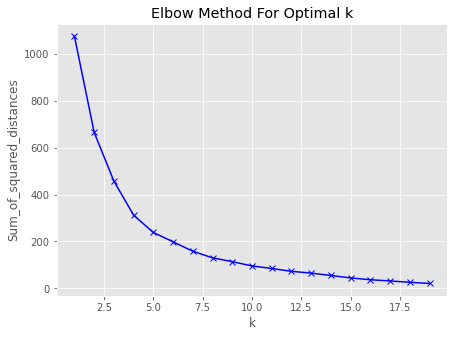

In [74]:
plt.figure(figsize=(7,5))
plt.plot(K, Sum_of_squared_distances,'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
#plt.savefig('elbow.png')
plt.show()

The elbow of the curve seems to be around k=5, so optimal number of clusters for k-means clustering is 5.

In [75]:
num_clusters = 5

k_means = KMeans(init="k-means++", n_clusters=num_clusters, n_init=4)
k_means.fit(cluster_dataset)
labels = k_means.labels_
unique_labels = set(labels)
print(unique_labels)

{0, 1, 2, 3, 4}


In [76]:
venue_cat["Labels"] = labels

In [77]:
venue_cat.head()

,Zip Code,Zip Code Latitude,Zip Code Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Labels
0,20001,38.907711,-77.01732,Saint's Paradise Cafeteria,38.905810,-77.020216,Southern / Soul Food Restaurant,4
2,20001,38.907711,-77.01732,Beau Thai,38.909882,-77.022019,Thai Restaurant,0
15,20002,38.901811,-76.99097,Toki Underground,38.900393,-76.989037,Noodle House,1
17,20002,38.901811,-76.99097,Cusbah,38.900410,-76.990470,Pakistani Restaurant,1
21,20002,38.901811,-76.99097,Smith Commons,38.900147,-76.988775,New American Restaurant,1


### Plot map with K-means clusters

In [78]:
cmap = cm.get_cmap('Spectral', num_clusters)    # PiYG
color_list = []
for i in range(cmap.N):
    rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
    color_list.append(matplotlib.colors.rgb2hex(rgb))

In [79]:
from folium import plugins
dc_map = folium.Map(location=[38.9072, -77.0369], zoom_start=11.5)
threshold_scale = np.linspace(df_complete['Total Population'].min(),
                              df_complete['Total Population'].max(),
                              6, dtype=float)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1]  + .1 # make sure that the last value of the list is greater than the maximum
    
dc_map.choropleth(
    geo_data=zip_geo,
    data=df_complete,
    columns=['Zip Code', 'Total Population'],
    key_on='feature.properties.ZIPCODE',
    fill_color='BuPu', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name=('Total Population'),
    threshold_scale=threshold_scale,
)
cmap = mpl.cm.viridis(np.linspace(0,1,20))
cmap = mpl.colors.ListedColormap(cmap[10:,:-1])

for lat, lng, venue, cluster in zip(venue_cat['Venue Latitude'], venue_cat['Venue Longitude'], venue_cat['Venue'], venue_cat['Labels']):
    label = '{}, {}'.format(venue, cluster)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color = color_list[cluster],
        fill=True,
        fill_color= color_list[cluster],
        fill_opacity=0.7,
        parse_html=False).add_to(dc_map)
#dc_map.save('kmeans.html')
dc_map

### Density-based clustering

In [80]:
from sklearn.cluster import DBSCAN 

In [81]:
X = venue_cat.values[:,4:6]
X = StandardScaler().fit_transform(X)
epsilon = 0.3
minimumSamples = 7
db = DBSCAN(eps=epsilon, min_samples=minimumSamples).fit(X)
labels = db.labels_
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
unique_labels = set(labels)
unique_labels

/Users/kateryan/anaconda/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


{-1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9}

In [82]:
venue_cat["DBLabels"] = labels

In [83]:
venue_cat.head()

,Zip Code,Zip Code Latitude,Zip Code Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Labels,DBLabels
0,20001,38.907711,-77.01732,Saint's Paradise Cafeteria,38.905810,-77.020216,Southern / Soul Food Restaurant,4,0
2,20001,38.907711,-77.01732,Beau Thai,38.909882,-77.022019,Thai Restaurant,0,0
15,20002,38.901811,-76.99097,Toki Underground,38.900393,-76.989037,Noodle House,1,1
17,20002,38.901811,-76.99097,Cusbah,38.900410,-76.990470,Pakistani Restaurant,1,1
21,20002,38.901811,-76.99097,Smith Commons,38.900147,-76.988775,New American Restaurant,1,1


### Plot map with density-based clusters

In [84]:
db_clusters = len(unique_labels)
cmap = cm.get_cmap('Spectral', db_clusters)    # PiYG
color_list = []
for i in range(cmap.N):
    rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
    color_list.append(matplotlib.colors.rgb2hex(rgb))

In [85]:
from folium import plugins
dc_map = folium.Map(location=[38.9072, -77.0369], zoom_start=11.5)
threshold_scale = np.linspace(df_complete['Total Population'].min(),
                              df_complete['Total Population'].max(),
                              6, dtype=float)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1]  + .1 # make sure that the last value of the list is greater than the maximum
    
dc_map.choropleth(
    geo_data=zip_geo,
    data=df_complete,
    columns=['Zip Code', 'Total Population'],
    key_on='feature.properties.ZIPCODE',
    fill_color='BuPu', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name=('Total Population'),
    threshold_scale=threshold_scale,
)
cmap = mpl.cm.viridis(np.linspace(0,1,20))
cmap = mpl.colors.ListedColormap(cmap[10:,:-1])

for lat, lng, venue, cluster in zip(venue_cat['Venue Latitude'], venue_cat['Venue Longitude'], venue_cat['Venue'], venue_cat['DBLabels']):
    label = '{}, {}'.format(venue, cluster)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color = color_list[cluster],
        fill=True,
        fill_color= color_list[cluster],
        fill_opacity=0.7,
        parse_html=False).add_to(dc_map)
#dc_map.save('densitybased.html')
dc_map

### Characterize Each Cluster

In [86]:
# characterize each cluster
def char_clust(num):
    clust = venue_cat.loc[venue_cat['DBLabels'] == num, venue_cat.columns[[0] + list(range(1, venue_cat.shape[1]))]]
    
    venue_ct = clust['Venue'].count()
    venue_type = len(clust['Venue Category'].unique())
    
    sport_ = clust[clust['Venue Category'].str.contains(sport)]
    sport_ct = sport_['Venue'].count()
    sport_rat = (sport_ct/venue_ct) * 100
    
    grocery_ = clust[clust['Venue Category'].str.contains(grocery)]
    grocery_ct = grocery_['Venue'].count()
    grocery_rat = (grocery_ct/venue_ct) * 100
    
    educ_ = clust[clust['Venue Category'].str.contains(educ)]
    educ_ct = educ_['Venue'].count()
    educ_rat = (educ_ct/venue_ct) * 100
    
    fastfood_ = clust[clust['Venue Category'].str.contains(fastfood)]
    fast_ct = fastfood_['Venue'].count()
    fast_rat = (fast_ct/venue_ct) * 100
    
    temprest = clust[clust['Venue Category'].str.contains(rest)]
    rest_ = temprest[~temprest['Venue Category'].str.contains(reduce_rest)]
    rest_ct = rest_['Venue'].count()
    rest_rat = (rest_ct/venue_ct) * 100
    
    unq = rest_['Venue Category'].unique()
    type_list=[]
    for i in unq:
        if i == 'Noodle House':
            rtype = 'Asian'
        elif i == 'New American Restaurant':
            rtype = 'American'
        elif 'Restaurant' in i:
            rtype = i.replace(' Restaurant','')
        else:
            rtype = i
        if rtype not in type_list:
            type_list.append(rtype)
    if 'Restaurant' in type_list:
        type_list.remove('Restaurant')
    
    d = {'Cluster':num, 'Venues':venue_ct, 'Venue Types':venue_type, 'Athletics': sport_ct, \
         'Grocery Stores':grocery_ct, 'Education':educ_ct, 'Fast Food':fast_ct, \
         'Restaurants':rest_ct, 'Restaurant Types':type_list}

    return (d)

In [87]:
# Create DataFrame with Venue Info
clus_df=pd.DataFrame(columns=['Cluster','Venues','Venue Types','Athletics','Grocery Stores',\
                             'Education','Fast Food','Restaurants','Restaurant Types', \
                              ])
for label in unique_labels:
    d = char_clust(label)
    clus_df = clus_df.append(d, ignore_index=True)
    

### Find the Racial Distribution for the Zip Codes that Fall in Each Cluster

***
To find the racial distribution of each cluster, I found the zip codes of each venue in that cluster and calculated the racial distribution of all of those zip codes combined.
***

In [88]:
# checking the column list consists just of population values
col_list=['White',
          'Black',
          'American Indian/Alaska Native',
          'Asian',
          'Native Hawaiian/Pacific Islander',
          'Other',
          'Mixed Race',
          'Hispanic/Latino',
          'Total Population']

In [89]:
# Function to calculate the racial distribution of the zip codes are fall into each cluster
def race_distr(i):
    clust = venue_cat.loc[venue_cat['DBLabels'] == i, venue_cat.columns[[0] + list(range(1, venue_cat.shape[1]))]]
    n = clust['Zip Code'].unique()
    a=pd.DataFrame()
    for i in n:
        a = a.append(df_complete[df_complete['Zip Code']==i])
        b = a[col_list]
        c = b.sum()
        for item in col_list:
            d[item] = c[item]/c['Total Population'] *100

    return ("White: {:.2f}%".format(d['White']), "Black: {:.2f}%".format(d['Black']), \
            "Hispanic/Latino: {:.2f}%".format(d['Hispanic/Latino']), "Asian: {:.2f}%".format(d['Asian']), \
            "American Indian/Alaska Native: {:.2f}%".format(d['American Indian/Alaska Native']), \
            "Native Hawaiian/Pacific Islander: {:.2f}%".format(d['Native Hawaiian/Pacific Islander']), \
            "Mixed Race: {:.2f}%".format(d['Mixed Race']), \
            "Other: {:.2f}%".format(d['Other']))


In [90]:
# Create DataFrame for racial distribution of each cluster
race_df=pd.DataFrame(columns=['Cluster','Race Distribution'])

for label in unique_labels:
    e = []
    race_list=[]
    e = race_distr(label)
    race_list.append(e)
    f = {'Cluster':label, 'Race Distribution':race_list}
    race_df = race_df.append(f, ignore_index=True)

In [91]:
# Merge venue cluster data with race cluster data
clus_anal = pd.merge(clus_df, race_df, on='Cluster', how='left')
clus_anal

,Cluster,Venues,Venue Types,Athletics,Grocery Stores,Education,Fast Food,Restaurants,Restaurant Types,Race Distribution
0,0,339,72,44,25,28,88,154,"[Southern / Soul Food, Thai, Brazilian, Steakh...","[(White: 54.87%, Black: 20.16%, Hispanic/Latin..."
1,1,34,26,6,2,3,9,16,"[Asian, Pakistani, American, Southern / Soul F...","[(White: 37.76%, Black: 48.70%, Hispanic/Latin..."
2,2,28,21,2,1,2,5,18,"[Chinese, American, Greek, Eastern European, B...","[(White: 56.58%, Black: 27.51%, Hispanic/Latin..."
3,3,8,7,1,2,0,1,4,"[French, Asian, Turkish, Italian]","[(White: 78.17%, Black: 3.18%, Hispanic/Latino..."
4,4,20,16,1,2,0,4,13,"[Steakhouse, Israeli, Italian, Mediterranean, ...","[(White: 72.53%, Black: 5.60%, Hispanic/Latino..."
5,5,20,17,3,1,0,2,14,"[Mexican, American, Asian, Filipino, Vietnames...","[(White: 37.99%, Black: 21.82%, Hispanic/Latin..."
6,6,20,15,4,1,4,4,7,"[Vietnamese, Ethiopian, Latin American, Americ...","[(White: 26.74%, Black: 56.45%, Hispanic/Latin..."
7,7,12,11,5,1,0,3,3,"[Chinese, American]","[(White: 9.28%, Black: 75.61%, Hispanic/Latino..."
8,8,25,17,3,3,2,6,11,"[Spanish, Mexican, Mediterranean, Italian, Fal...","[(White: 37.03%, Black: 45.18%, Hispanic/Latin..."
9,9,9,9,3,0,4,2,0,[],"[(White: 75.32%, Black: 4.50%, Hispanic/Latino..."


In [92]:
# Concatenate together all the venue data
def ven_distr(i):
    a=pd.DataFrame()
    a = a.append(clus_anal[clus_anal['Cluster']==i])
    for item in venue_list:
        d[item] = a[item]/a['Venues'] *100
    if(i==-1):
        i=10
    return ("Athletics: {:.2f}%".format(d['Athletics'][i]), "Grocery: {:.2f}%".format(d['Grocery Stores'][i]), \
            "Education: {:.2f}%".format(d['Education'][i]), "Fast Food: {:.2f}%".format(d['Fast Food'][i]), \
            "Restaurants: {:.2f}%".format(d['Restaurants'][i]))

In [93]:
ven_distr(-1)

('Athletics: 27.27%',
 'Grocery: 18.18%',
 'Education: 0.00%',
 'Fast Food: 31.82%',
 'Restaurants: 22.73%')

In [94]:
unique_labels

{-1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9}

In [95]:
# Create DataFrame for racial distribution of each cluster
ven_df=pd.DataFrame(columns=['Cluster','Venue Distribution'])
for label in unique_labels:
    e = []
    ven_rat=[]
    e = ven_distr(label)
    ven_rat.append(e)
    f = {'Cluster':label, 'Venue Distribution':ven_rat}
    ven_df = ven_df.append(f, ignore_index=True)

In [96]:
ven_df

,Cluster,Venue Distribution
0,0,"[(Athletics: 12.98%, Grocery: 7.37%, Education..."
1,1,"[(Athletics: 17.65%, Grocery: 5.88%, Education..."
2,2,"[(Athletics: 7.14%, Grocery: 3.57%, Education:..."
3,3,"[(Athletics: 12.50%, Grocery: 25.00%, Educatio..."
4,4,"[(Athletics: 5.00%, Grocery: 10.00%, Education..."
5,5,"[(Athletics: 15.00%, Grocery: 5.00%, Education..."
6,6,"[(Athletics: 20.00%, Grocery: 5.00%, Education..."
7,7,"[(Athletics: 41.67%, Grocery: 8.33%, Education..."
8,8,"[(Athletics: 12.00%, Grocery: 12.00%, Educatio..."
9,9,"[(Athletics: 33.33%, Grocery: 0.00%, Education..."


In [97]:
clus_anal.head()

,Cluster,Venues,Venue Types,Athletics,Grocery Stores,Education,Fast Food,Restaurants,Restaurant Types,Race Distribution
0,0,339,72,44,25,28,88,154,"[Southern / Soul Food, Thai, Brazilian, Steakh...","[(White: 54.87%, Black: 20.16%, Hispanic/Latin..."
1,1,34,26,6,2,3,9,16,"[Asian, Pakistani, American, Southern / Soul F...","[(White: 37.76%, Black: 48.70%, Hispanic/Latin..."
2,2,28,21,2,1,2,5,18,"[Chinese, American, Greek, Eastern European, B...","[(White: 56.58%, Black: 27.51%, Hispanic/Latin..."
3,3,8,7,1,2,0,1,4,"[French, Asian, Turkish, Italian]","[(White: 78.17%, Black: 3.18%, Hispanic/Latino..."
4,4,20,16,1,2,0,4,13,"[Steakhouse, Israeli, Italian, Mediterranean, ...","[(White: 72.53%, Black: 5.60%, Hispanic/Latino..."


In [98]:
# Merge venue cluster data with race cluster data
final_df = pd.merge(clus_anal, ven_df, on='Cluster', how='left')
#final_df
final_df.drop(columns=['Athletics','Grocery Stores','Education','Fast Food', 'Restaurants'], inplace=True)

In [99]:
final_df.to_csv('cluster_analysis.csv', index=False)

In [100]:
final_df

,Cluster,Venues,Venue Types,Restaurant Types,Race Distribution,Venue Distribution
0,0,339,72,"[Southern / Soul Food, Thai, Brazilian, Steakh...","[(White: 54.87%, Black: 20.16%, Hispanic/Latin...","[(Athletics: 12.98%, Grocery: 7.37%, Education..."
1,1,34,26,"[Asian, Pakistani, American, Southern / Soul F...","[(White: 37.76%, Black: 48.70%, Hispanic/Latin...","[(Athletics: 17.65%, Grocery: 5.88%, Education..."
2,2,28,21,"[Chinese, American, Greek, Eastern European, B...","[(White: 56.58%, Black: 27.51%, Hispanic/Latin...","[(Athletics: 7.14%, Grocery: 3.57%, Education:..."
3,3,8,7,"[French, Asian, Turkish, Italian]","[(White: 78.17%, Black: 3.18%, Hispanic/Latino...","[(Athletics: 12.50%, Grocery: 25.00%, Educatio..."
4,4,20,16,"[Steakhouse, Israeli, Italian, Mediterranean, ...","[(White: 72.53%, Black: 5.60%, Hispanic/Latino...","[(Athletics: 5.00%, Grocery: 10.00%, Education..."
5,5,20,17,"[Mexican, American, Asian, Filipino, Vietnames...","[(White: 37.99%, Black: 21.82%, Hispanic/Latin...","[(Athletics: 15.00%, Grocery: 5.00%, Education..."
6,6,20,15,"[Vietnamese, Ethiopian, Latin American, Americ...","[(White: 26.74%, Black: 56.45%, Hispanic/Latin...","[(Athletics: 20.00%, Grocery: 5.00%, Education..."
7,7,12,11,"[Chinese, American]","[(White: 9.28%, Black: 75.61%, Hispanic/Latino...","[(Athletics: 41.67%, Grocery: 8.33%, Education..."
8,8,25,17,"[Spanish, Mexican, Mediterranean, Italian, Fal...","[(White: 37.03%, Black: 45.18%, Hispanic/Latin...","[(Athletics: 12.00%, Grocery: 12.00%, Educatio..."
9,9,9,9,[],"[(White: 75.32%, Black: 4.50%, Hispanic/Latino...","[(Athletics: 33.33%, Grocery: 0.00%, Education..."
